In [1]:
import json
from datetime import datetime
from pathlib import Path

import h5netcdf
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as sps
import xarray as xr

In [2]:
plt.style.use("default")
plt.rcParams.update(
    {
        "savefig.pad_inches": 0,
        "axes.titlesize": 8,
        "axes.titlepad": 3,
        "axes.labelsize": 8,
        "legend.fontsize": 8,
    }
)
figsuffix: str = ".png"
figdpi: int = 600
FIGUREROOT = Path("../fig")

In [3]:
# China boundaries and mask
CNBOUNDARYFILE = Path("china_province_boundaries.json")
with open(CNBOUNDARYFILE, "r", encoding="utf8") as f:
    cnboundaries = json.load(f)


def plot_cnboundaries(ax):
    for f in cnboundaries["features"]:
        for c in f["geometry"]["coordinates"]:
            if len(c) != 1:
                ax.plot(*zip(*c), color="black", linewidth=0.5)
            else:
                for cc in c:
                    ax.plot(*zip(*cc), color="black", linewidth=0.5)
    ax.set_xticks([80, 100, 120])
    ax.set_xticklabels(["80°E", "100°E", "120°E"])
    ax.set_yticks([20, 30, 40, 50])
    ax.set_yticklabels(["20°N", "30°N", "40°N", "50°N"])
    ax.set_ylim(17.8, 54)
    ax.set_xlim(73, 135.5)
    ax.set_aspect("equal")


with h5netcdf.File("../data/mask.nc") as f:
    lon: np.ndarray[tuple[int], np.dtype[np.floating]] = f["lon"][:]
    lat: np.ndarray[tuple[int], np.dtype[np.floating]] = f["lat"][:]
    mask: np.ndarray[tuple[int, int], np.dtype[np.bool_]] = f["mask"][0, :, :] == 1
lat2d, lon2d = np.meshgrid(lat, lon, indexing="ij")
area = (6371.0 * np.deg2rad(0.1)) ** 2 * np.cos(np.deg2rad(lat2d))
areaofchina = np.nansum(np.where(mask, area, np.nan))

In [4]:
# read nino-3.4 index
with open("../data/nina34.anom.data.txt", "r") as f:
    nino_year_beg, nino_year_end = [int(x) for x in f.readline().split()]
    nino34 = xr.DataArray(
        np.float32(np.nan),
        coords={
            "time": xr.cftime_range(
                f"{nino_year_beg}-01", f"{nino_year_end}-12", freq="MS"
            )
        },
        dims=[
            "time",
        ],
    )
    for y in range(nino_year_beg, nino_year_end + 1):
        line = f.readline().split()
        for m in range(1, 13):
            nino34.loc[f"{y}-{m:02}"] = (
                float(line[m]) if line[m] != "-99.99" else np.nan
            )

In [5]:
ELNINOYEARS = set(
    [
        1980,
        1983,
        1987,
        1998,
        1992,
        1995,
        1998,
        2003,
        2005,
        2007,
        2010,
        2015,
        2016,
        2019,
    ]
)
LANINAYEARS = set(
    [1984, 1985, 1989, 1996, 1999, 2000, 2001, 2006, 2008, 2009, 2011, 2012, 2017, 2018]
)
STRONGELNINOYEARS = set(
    [
        1983,
        1988,
        1992,
        1998,
        2010,
        2016,
    ]
)
STRONGLANINAYEARS = set(
    [
        1989,
        1999,
        2000,
        2008,
        2011,
    ]
)

In [6]:
MONFILE = Path("../data/clearness.mon.nc")
YEAR_BEGIN = 1984
YEAR_END = 2020

ds_utc = xr.open_dataset(MONFILE)
mon = xr.DataArray(
    ds_utc["clearness"].data,
    coords={
        "time": xr.cftime_range("1979-01-01", "2020-12-31", freq="MS"),
        "lat": ds_utc["lat"].data,
        "lon": ds_utc["lon"].data,
    },
    dims=("time", "lat", "lon"),
)
del ds_utc
mon.data[np.tile(~mask[np.newaxis, :, :], (mon.shape[0], 1, 1))] = np.nan

In [7]:
mon = mon.sel(time=slice(f"{YEAR_BEGIN-1}-12-01", f"{YEAR_END}-11-30"))
nino34 = nino34.sel(time=slice(f"{YEAR_BEGIN-1}-12-01", f"{YEAR_END}-11-30"))

In [8]:
normalyears = list(
    sorted(set(range(YEAR_BEGIN, YEAR_END + 1)) - ELNINOYEARS - LANINAYEARS)
)
elninoyears = list(sorted(set(range(YEAR_BEGIN, YEAR_END + 1)) & ELNINOYEARS))
laninayears = list(sorted(set(range(YEAR_BEGIN, YEAR_END + 1)) & LANINAYEARS))
strongelninoyears = list(sorted(set(elninoyears) & STRONGELNINOYEARS))
stronglaninayears = list(sorted(set(laninayears) & STRONGLANINAYEARS))
print(len(normalyears), len(elninoyears), len(laninayears))

12 11 14


In [9]:
# seasonal average
sea = xr.DataArray(
    np.float32(np.nan),
    coords={
        "year": np.arange(YEAR_BEGIN, YEAR_END + 1),
        "season": ["DJF", "MAM", "JJA", "SON"],
        "lat": mon.lat,
        "lon": mon.lon,
    },
    dims=("year", "season", "lat", "lon"),
    name="seasonal clearness index",
)
sea_enso = xr.DataArray(
    np.float32(np.nan),
    coords={
        "enso": ["normal", "elnino", "lanina"],
        "season": ["DJF", "MAM", "JJA", "SON"],
        "case": range(max(len(normalyears), len(elninoyears), len(laninayears))),
        "lat": mon.lat,
        "lon": mon.lon,
    },
    dims=("enso", "season", "case", "lat", "lon"),
    name="seasonal clearness index",
)
sea_strongenso = xr.DataArray(
    np.float32(np.nan),
    coords={
        "enso": ["strongelnino", "stronglanina"],
        "season": ["DJF", "MAM", "JJA", "SON"],
        "case": range(max(len(normalyears), len(elninoyears), len(laninayears))),
        "lat": mon.lat,
        "lon": mon.lon,
    },
    dims=("enso", "season", "case", "lat", "lon"),
    name="seasonal clearness index",
)

for y in sea.year.values:
    # DJF
    weights = np.array(
        [
            (datetime(y, 1, 1) - datetime(y - 1, 12, 1)).total_seconds(),
            (datetime(y, 2, 1) - datetime(y, 1, 1)).total_seconds(),
            (datetime(y, 3, 1) - datetime(y, 2, 1)).total_seconds(),
        ]
    )
    weights = weights / weights.sum()
    sea.sel(year=y, season="DJF")[:] = np.average(
        mon.sel(time=slice(f"{y-1}-12-01", f"{y}-02-28")).data, axis=0, weights=weights
    )
    # MAM
    weights = np.array(
        [
            (datetime(y, 4, 1) - datetime(y, 3, 1)).total_seconds(),
            (datetime(y, 5, 1) - datetime(y, 4, 1)).total_seconds(),
            (datetime(y, 6, 1) - datetime(y, 5, 1)).total_seconds(),
        ]
    )
    weights = weights / weights.sum()
    sea.sel(year=y, season="MAM")[:] = np.average(
        mon.sel(time=slice(f"{y}-03-01", f"{y}-05-31")).data, axis=0, weights=weights
    )
    # JJA
    weights = np.array(
        [
            (datetime(y, 7, 1) - datetime(y, 6, 1)).total_seconds(),
            (datetime(y, 8, 1) - datetime(y, 7, 1)).total_seconds(),
            (datetime(y, 9, 1) - datetime(y, 8, 1)).total_seconds(),
        ]
    )
    weights = weights / weights.sum()
    sea.sel(year=y, season="JJA")[:] = np.average(
        mon.sel(time=slice(f"{y}-06-01", f"{y}-08-30")).data, axis=0, weights=weights
    )
    # SON
    weights = np.array(
        [
            (datetime(y, 10, 1) - datetime(y, 9, 1)).total_seconds(),
            (datetime(y, 11, 1) - datetime(y, 10, 1)).total_seconds(),
            (datetime(y, 12, 1) - datetime(y, 11, 1)).total_seconds(),
        ]
    )
    weights = weights / weights.sum()
    sea.sel(year=y, season="SON")[:] = np.average(
        mon.sel(time=slice(f"{y}-09-01", f"{y}-11-30")).data, axis=0, weights=weights
    )
    if y in elninoyears:
        for season in "DJF", "MAM", "JJA", "SON":
            sea_enso.sel(enso="elnino", case=elninoyears.index(y), season=season)[
                :
            ] = sea.sel(year=y, season=season)
    elif y in laninayears:
        for season in "DJF", "MAM", "JJA", "SON":
            sea_enso.sel(enso="lanina", case=laninayears.index(y), season=season)[
                :
            ] = sea.sel(year=y, season=season)
    else:
        for season in "DJF", "MAM", "JJA", "SON":
            sea_enso.sel(enso="normal", case=normalyears.index(y), season=season)[
                :
            ] = sea.sel(year=y, season=season)
    if y in strongelninoyears:
        for season in "DJF", "MAM", "JJA", "SON":
            sea_strongenso.sel(
                enso="strongelnino", case=strongelninoyears.index(y), season=season
            )[:] = sea.sel(year=y, season=season)
    elif y in stronglaninayears:
        for season in "DJF", "MAM", "JJA", "SON":
            sea_strongenso.sel(
                enso="stronglanina", case=stronglaninayears.index(y), season=season
            )[:] = sea.sel(year=y, season=season)

In [10]:
# yearly data
# each year starts from December and ends at November
yrl = xr.DataArray(
    np.float32(np.nan),
    coords={
        "year": sea.year,
        "lat": mon.lat,
        "lon": mon.lon,
    },
    dims=("year", "lat", "lon"),
)

for y in yrl.year.values:
    weights = np.array(
        [
            (datetime(y, 3, 1) - datetime(y - 1, 12, 1)).total_seconds(),
            (datetime(y, 6, 1) - datetime(y, 3, 1)).total_seconds(),
            (datetime(y, 9, 1) - datetime(y, 6, 1)).total_seconds(),
            (datetime(y, 12, 1) - datetime(y, 9, 1)).total_seconds(),
        ]
    )
    weights = weights / weights.sum()
    yrl.sel(year=y)[:] = np.average(sea.sel(year=y).data, axis=0, weights=weights)

In [11]:
# multi-year averaged annual cycle and interannual anomalies
mya = mon.groupby("time.month").mean("time")
anom = mon.copy()
for m in mon.time.data:
    anom.sel(time=m)[:] -= mya.sel(month=m.month)

In [12]:
# Pearson correlation coefficients and the p-values
cc = yrl.mean("year").copy()
cc[:] = np.nan
ccp = cc.copy()

for ilat in range(len(cc.lat)):
    for ilon in range(len(cc.lon)):
        if mask[ilat, ilon] and not np.any(np.isnan(mon[:, ilat, ilon])):
            cc[ilat, ilon], ccp[ilat, ilon] = sps.pearsonr(
                nino34.data, mon[:, ilat, ilon].data
            )

In [13]:
# Spearman correlation coefficients and the p-values
ccs = yrl.mean("year").copy()
ccs[:] = np.nan
ccsp = ccs.copy()

for ilat in range(len(ccs.lat)):
    for ilon in range(len(ccs.lon)):
        if mask[ilat, ilon] and not np.any(np.isnan(mon[:, ilat, ilon])):
            ccs[ilat, ilon], ccsp[ilat, ilon] = sps.spearmanr(
                nino34.data, mon[:, ilat, ilon].data
            )

In [14]:
# anomalies during El Niño and La Niña and the p-values
anom_elnino = sea_enso.mean(dim="case").sel(enso="elnino") - sea.mean("year")
anomp_elnino = xr.DataArray(
    np.float32(np.nan),
    coords={"season": ["DJF", "MAM", "JJA", "SON"], "lat": mon.lat, "lon": mon.lon},
    dims=("season", "lat", "lon"),
)
for s in anomp_elnino.season.values:
    anomp_elnino.sel(season=s)[:] = sps.ttest_ind(
        sea_enso.sel(enso="elnino", season=s)[0 : len(elninoyears), :, :].data.reshape(
            len(elninoyears), -1
        ),
        sea.sel(season=s).data.reshape(len(sea.year), -1),
    ).pvalue.reshape(len(sea_enso.lat), len(sea_enso.lon))

anom_lanina = sea_enso.mean(dim="case").sel(enso="lanina") - sea.mean("year")
anomp_lanina = xr.DataArray(
    np.float32(np.nan),
    coords={"season": ["DJF", "MAM", "JJA", "SON"], "lat": mon.lat, "lon": mon.lon},
    dims=("season", "lat", "lon"),
)
for s in anomp_lanina.season.values:
    anomp_lanina.sel(season=s)[:] = sps.ttest_ind(
        sea_enso.sel(enso="lanina", season=s)[0 : len(laninayears), :, :].data.reshape(
            len(laninayears), -1
        ),
        sea.sel(season=s).data.reshape(len(sea.year), -1),
    ).pvalue.reshape(len(sea_enso.lat), len(sea_enso.lon))

In [15]:
# anomalies during strong El Niño and La Niña and the p-values
anom_strongelnino = sea_strongenso.mean(dim="case").sel(enso="strongelnino") - sea.mean(
    "year"
)
anomp_strongelnino = xr.DataArray(
    np.float32(np.nan),
    coords={"season": ["DJF", "MAM", "JJA", "SON"], "lat": mon.lat, "lon": mon.lon},
    dims=("season", "lat", "lon"),
)
for s in anomp_strongelnino.season.values:
    anomp_strongelnino.sel(season=s)[:] = sps.ttest_ind(
        sea_strongenso.sel(enso="strongelnino", season=s)[
            0 : len(strongelninoyears), :, :
        ].data.reshape(len(strongelninoyears), -1),
        sea.sel(season=s).data.reshape(len(sea.year), -1),
    ).pvalue.reshape(len(sea_enso.lat), len(sea_enso.lon))

anom_stronglanina = sea_strongenso.mean(dim="case").sel(enso="stronglanina") - sea.mean(
    "year"
)
anomp_stronglanina = xr.DataArray(
    np.float32(np.nan),
    coords={"season": ["DJF", "MAM", "JJA", "SON"], "lat": mon.lat, "lon": mon.lon},
    dims=("season", "lat", "lon"),
)
for s in anomp_stronglanina.season.values:
    anomp_stronglanina.sel(season=s)[:] = sps.ttest_ind(
        sea_strongenso.sel(enso="stronglanina", season=s)[
            0 : len(stronglaninayears), :, :
        ].data.reshape(len(stronglaninayears), -1),
        sea.sel(season=s).data.reshape(len(sea.year), -1),
    ).pvalue.reshape(len(sea_enso.lat), len(sea_enso.lon))

In [16]:
tmp = yrl.mean("year").data
tmp = tmp[np.logical_not(np.isnan(tmp))]
np.quantile(tmp, [0.01, 0.99])

array([0.29911669, 0.66126789])

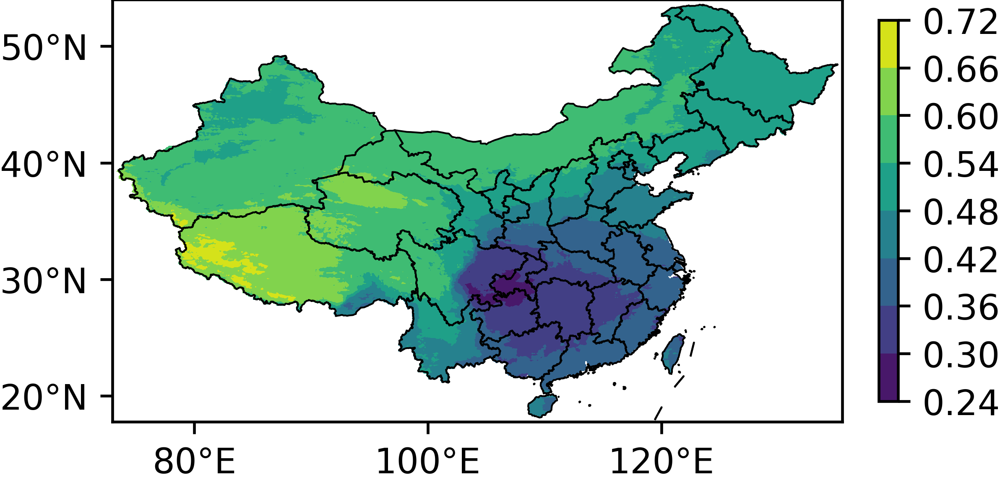

In [17]:
# spatial distribution of the clearness index
fig = plt.figure(figsize=(4, 2), dpi=600, layout="constrained")
axs = fig.subplots(1, 1)

ax = axs
x = yrl.mean("year").values
cf = plt.contourf(lon, lat, x)
plot_cnboundaries(ax)
cb = plt.colorbar(cf, ax=axs, shrink=0.9, extend="both")

fig.savefig(FIGUREROOT.joinpath("distribution.png").with_suffix(figsuffix), dpi=figdpi)

0.78739023 0.17156978
0.705026 0.27442366
0.6733561 0.29738715
0.75516593 0.24894336


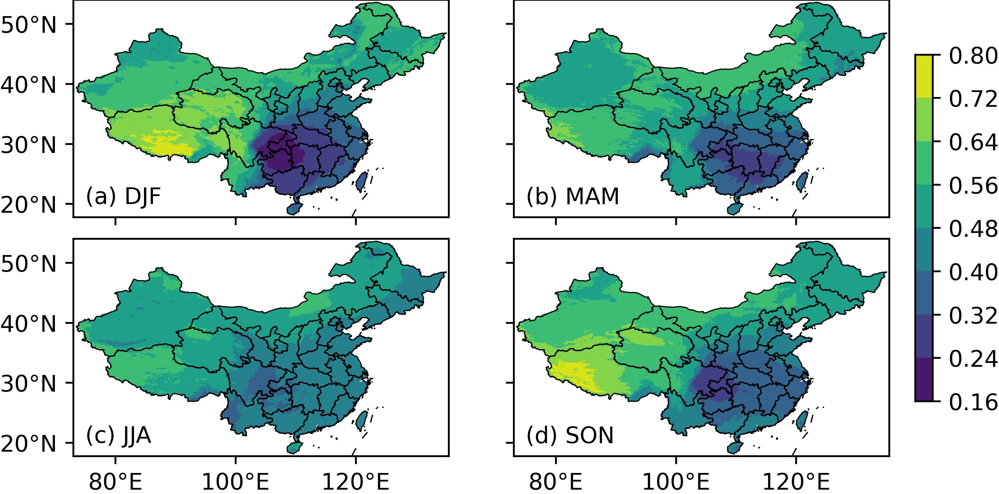

In [18]:
# seasonal patterns of the clearness index
fig = plt.figure(figsize=(6.13, 3.1), dpi=600, layout="constrained")
axs = fig.subplots(2, 2)

levels = np.arange(0.16, 0.801, 0.08)

x = sea.mean(dim="year")

ax = axs[0, 0]
cf = ax.contourf(lon, lat, x.sel(season="DJF"), levels=levels)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.text(75, 20, "(a) DJF")
print(np.nanmax(x.sel(season="DJF")), np.nanmin(x.sel(season="DJF")))

ax = axs[0, 1]
cf = ax.contourf(lon, lat, x.sel(season="MAM"), levels=levels)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.text(75, 20, "(b) MAM")
print(np.nanmax(x.sel(season="MAM")), np.nanmin(x.sel(season="MAM")))


ax = axs[1, 0]
cf = ax.contourf(lon, lat, x.sel(season="JJA"), levels=levels)
plot_cnboundaries(ax)
ax.text(75, 20, "(c) JJA")
print(np.nanmax(x.sel(season="JJA")), np.nanmin(x.sel(season="JJA")))


ax = axs[1, 1]
cf = ax.contourf(lon, lat, x.sel(season="SON"), levels=levels)
plot_cnboundaries(ax)
ax.set_yticklabels([])
ax.text(75, 20, "(d) SON")
print(np.nanmax(x.sel(season="SON")), np.nanmin(x.sel(season="SON")))


cb = plt.colorbar(cf, ax=axs, shrink=0.9, pad=0.03, fraction=0.02, extend="both")
fig.savefig(FIGUREROOT.joinpath("seasons.png").with_suffix(figsuffix), dpi=figdpi)

In [19]:
(mya.std("month") / yrl.mean("year")).mean().values

/Users/zhenghui/work/paper-2024-enso-china-clearness-iav/.venv/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


array(0.10516555, dtype=float32)

/Users/zhenghui/work/paper-2024-enso-china-clearness-iav/.venv/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


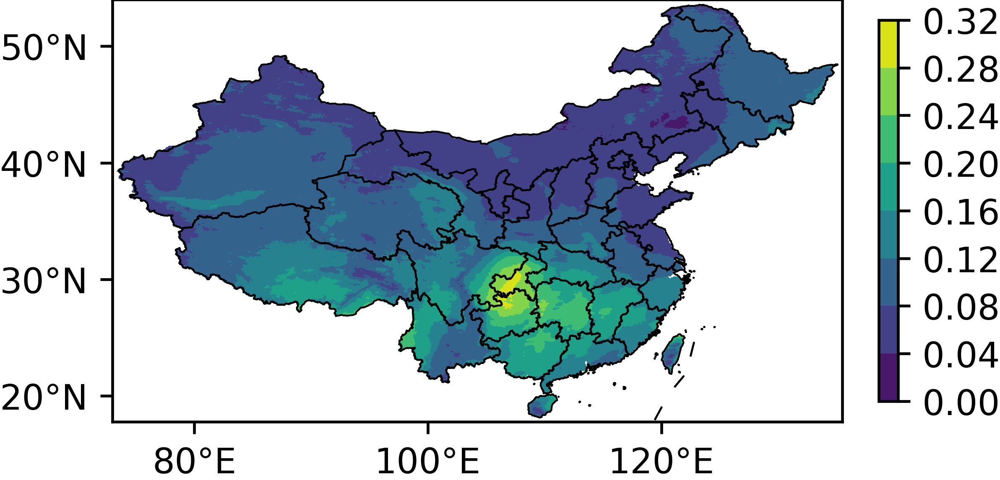

In [20]:
# spatial distribution of the seasonal variability
fig = plt.figure(figsize=(4, 2), dpi=600, layout="constrained")
axs = fig.subplots(1, 1)

ax = axs
x = mya.std("month") / yrl.mean("year")
cf = plt.contourf(lon, lat, x)
plot_cnboundaries(ax)
cb = plt.colorbar(cf, ax=axs, shrink=0.9, extend="both")

fig.savefig(FIGUREROOT.joinpath("szv.png").with_suffix(figsuffix), dpi=figdpi)

/Users/zhenghui/work/paper-2024-enso-china-clearness-iav/.venv/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


0.38320953 0.025737833 0.081858814
0.2517452 0.022950232 0.06493089
0.18151353 0.022277314 0.061149545
0.30600768 0.022438351 0.06691205


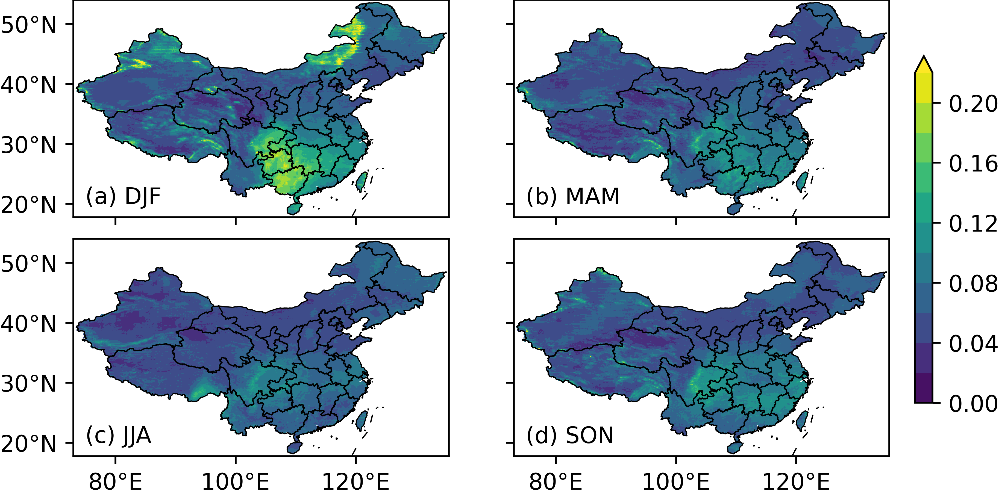

In [21]:
# interannual variability of the clearness index
fig = plt.figure(figsize=(6.13, 3.1), dpi=600, layout="constrained")
axs = fig.subplots(2, 2)

levels = np.arange(0.0, 0.24, 0.02)

x = sea.std(dim="year")
y = sea.mean(dim="year")

ax = axs[0, 0]
z = x.sel(season="DJF") / y.sel(season="DJF")
cf = ax.contourf(lon, lat, z, levels=levels, extend="max")
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.text(75, 20, "(a) DJF")
print(np.nanmax(z), np.nanmin(z), np.nanmean(z))

ax = axs[0, 1]
z = x.sel(season="MAM") / y.sel(season="MAM")
cf = ax.contourf(lon, lat, z, levels=levels, extend="max")
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.text(75, 20, "(b) MAM")
print(np.nanmax(z), np.nanmin(z), np.nanmean(z))


ax = axs[1, 0]
z = x.sel(season="JJA") / y.sel(season="JJA")
cf = ax.contourf(lon, lat, z, levels=levels, extend="max")
plot_cnboundaries(ax)
ax.text(75, 20, "(c) JJA")
print(np.nanmax(z), np.nanmin(z), np.nanmean(z))


ax = axs[1, 1]
z = x.sel(season="SON") / y.sel(season="SON")
cf = ax.contourf(lon, lat, z, levels=levels, extend="max")
plot_cnboundaries(ax)
ax.set_yticklabels([])
ax.text(75, 20, "(d) SON")
print(np.nanmax(z), np.nanmin(z), np.nanmean(z))


cb = plt.colorbar(cf, ax=axs, shrink=0.9, pad=0.03, fraction=0.02, extend="max")
fig.savefig(FIGUREROOT.joinpath("iav.png").with_suffix(figsuffix), dpi=figdpi)

In [22]:
print(len(normalyears), len(elninoyears), len(laninayears))

12 11 14


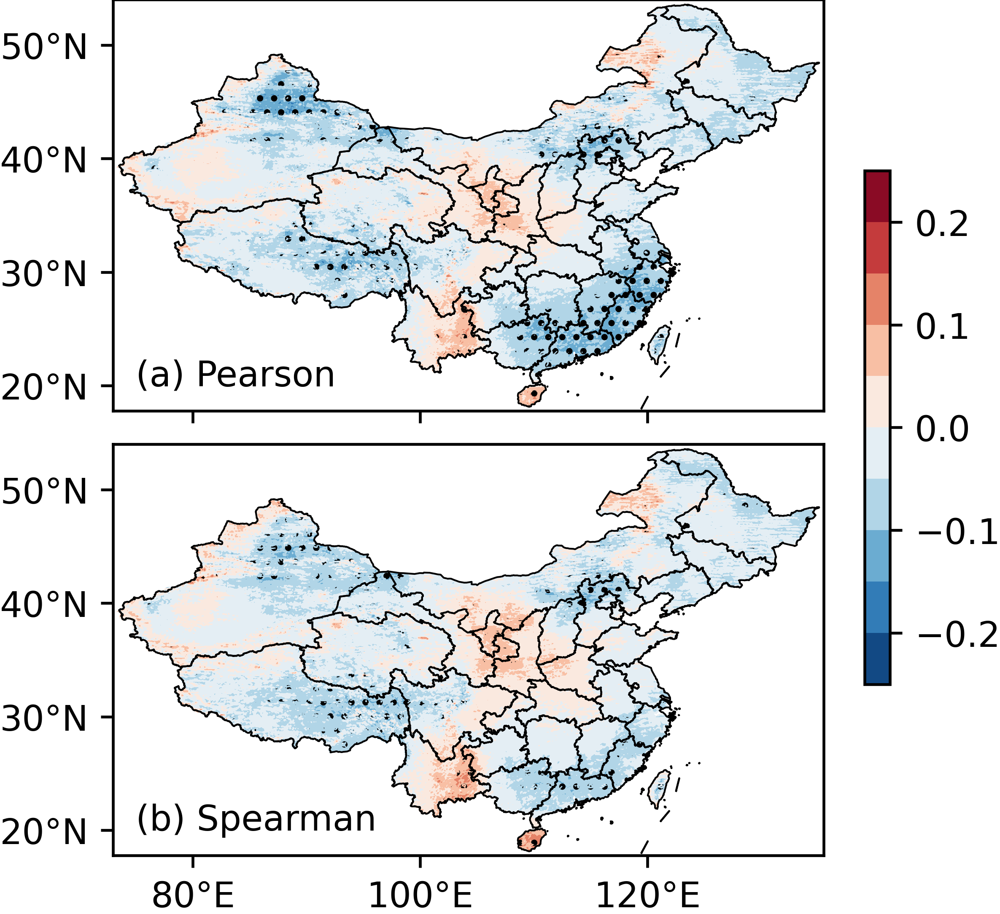

In [23]:
# correlation coefficient
fig = plt.figure(figsize=(4, 3.7), dpi=600, layout="constrained")
axs = fig.subplots(2, 1)

levels = np.arange(-0.25, 0.251, 0.05)

ax = axs[0]
cf = ax.contourf(lon, lat, cc, cmap="RdBu_r", levels=levels)
ax.contourf(lon, lat, ccp, levels=[0, 0.1], colors="none", hatches=["..."])
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.text(75, 20, "(a) Pearson")

ax = axs[1]
cf = ax.contourf(lon, lat, ccs, cmap="RdBu_r", levels=levels)
ax.contourf(lon, lat, ccsp, levels=[0, 0.1], colors="none", hatches=["..."])
plot_cnboundaries(ax)
ax.text(75, 20, "(b) Spearman")

cb = plt.colorbar(cf, ax=axs, shrink=0.6, extend="both")

fig.savefig(FIGUREROOT.joinpath("correlation.png").with_suffix(figsuffix), dpi=figdpi)

In [24]:
anomt_elnino = sps.ttest_ind(
    sea_enso.sel(enso="elnino", season="DJF")[0 : len(elninoyears), :, :].data.reshape(
        len(elninoyears), -1
    ),
    sea.sel(season="DJF").data.reshape(len(sea.year), -1),
)

0.049858242 -0.06440109
0.036012173 -0.038351476
0.02688092 -0.03098327
0.038689554 -0.048935503


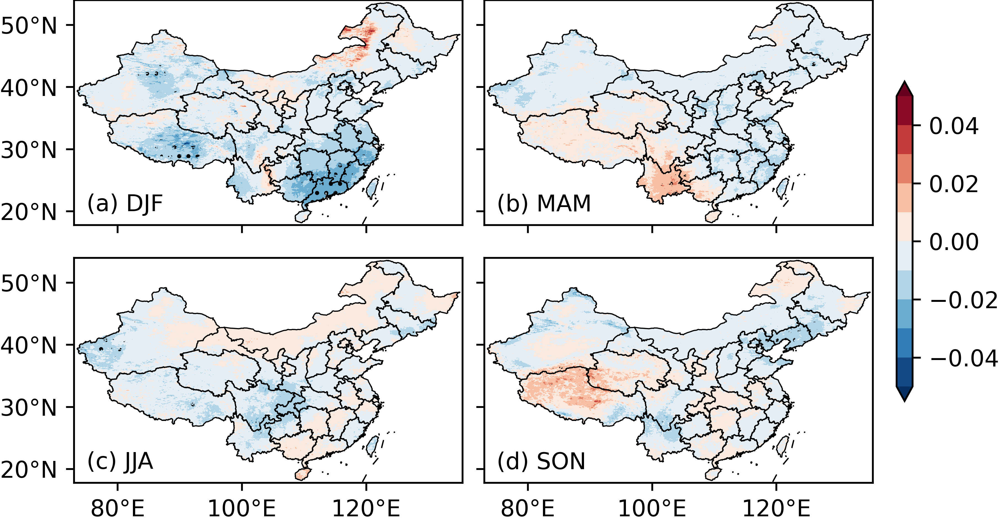

In [25]:
# anomalies in four seasons during El Niño
fig = plt.figure(figsize=(6.13, 3.3), dpi=600, layout="constrained")
axs = fig.subplots(2, 2)

levels = np.arange(-0.05, 0.051, 0.01)

ax = axs[0, 0]
x = anom_elnino.sel(season="DJF")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_elnino.sel(season="DJF"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.text(75, 20, "(a) DJF")
print(np.nanmax(x), np.nanmin(x))

ax = axs[0, 1]
x = anom_elnino.sel(season="MAM")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_elnino.sel(season="MAM"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.text(75, 20, "(b) MAM")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 0]
x = anom_elnino.sel(season="JJA")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_elnino.sel(season="JJA"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.text(75, 20, "(c) JJA")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 1]
x = anom_elnino.sel(season="SON")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_elnino.sel(season="SON"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.set_yticklabels([])
ax.text(75, 20, "(d) SON")
print(np.nanmax(x), np.nanmin(x))

cb = plt.colorbar(cf, ax=axs, shrink=0.9, pad=0.03, fraction=0.02, extend="max")
fig.savefig(FIGUREROOT.joinpath("anom_elnino.png").with_suffix(figsuffix), dpi=figdpi)

0.04959947 -0.054471523
0.043395817 -0.030767351
0.031663626 -0.024584651
0.03544295 -0.043414474


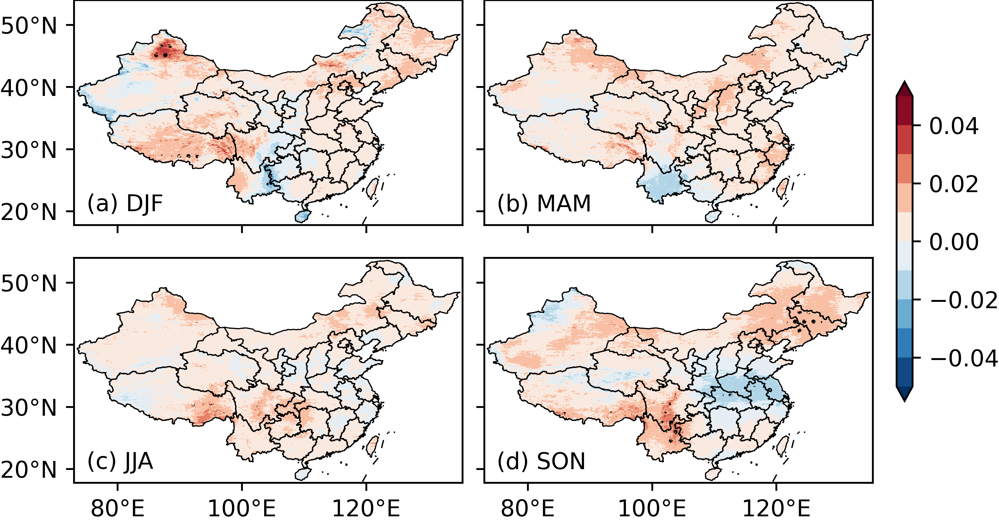

In [26]:
# anomalies in four seasons during La Niña
fig = plt.figure(figsize=(6.13, 3.3), dpi=600, layout="constrained")
axs = fig.subplots(2, 2)

levels = np.arange(-0.05, 0.051, 0.01)

ax = axs[0, 0]
x = anom_lanina.sel(season="DJF")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_lanina.sel(season="DJF"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.text(75, 20, "(a) DJF")
print(np.nanmax(x), np.nanmin(x))

ax = axs[0, 1]
x = anom_lanina.sel(season="MAM")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_lanina.sel(season="MAM"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.text(75, 20, "(b) MAM")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 0]
x = anom_lanina.sel(season="JJA")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_lanina.sel(season="JJA"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.text(75, 20, "(c) JJA")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 1]
x = anom_lanina.sel(season="SON")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_lanina.sel(season="SON"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.set_yticklabels([])
ax.text(75, 20, "(d) SON")
print(np.nanmax(x), np.nanmin(x))

cb = plt.colorbar(cf, ax=axs, shrink=0.9, pad=0.03, fraction=0.02, extend="max")
fig.savefig(FIGUREROOT.joinpath("anom_lanina.png").with_suffix(figsuffix), dpi=figdpi)

0.11420414 -0.13375685
0.065603375 -0.07093468
0.038876653 -0.052592427
0.038689554 -0.048935503


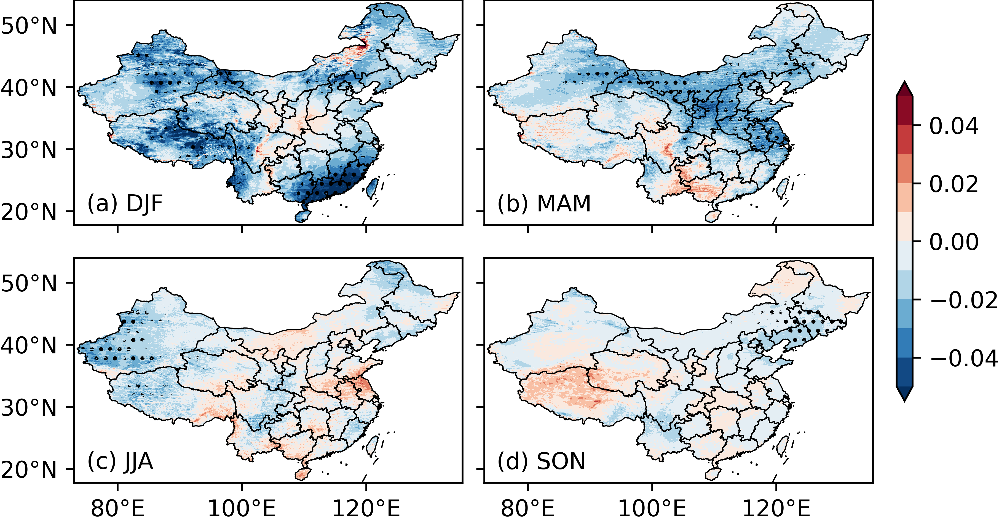

In [27]:
# anomalies in four seasons during strong El Niño
fig = plt.figure(figsize=(6.13, 3.3), dpi=600, layout="constrained")
axs = fig.subplots(2, 2)

levels = np.arange(-0.05, 0.051, 0.01)

ax = axs[0, 0]
x = anom_strongelnino.sel(season="DJF")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_strongelnino.sel(season="DJF"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.text(75, 20, "(a) DJF")
print(np.nanmax(x), np.nanmin(x))

ax = axs[0, 1]
x = anom_strongelnino.sel(season="MAM")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_strongelnino.sel(season="MAM"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.text(75, 20, "(b) MAM")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 0]
x = anom_strongelnino.sel(season="JJA")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_strongelnino.sel(season="JJA"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.text(75, 20, "(c) JJA")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 1]
x = anom_elnino.sel(season="SON")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_strongelnino.sel(season="SON"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.set_yticklabels([])
ax.text(75, 20, "(d) SON")
print(np.nanmax(x), np.nanmin(x))

cb = plt.colorbar(cf, ax=axs, shrink=0.9, pad=0.03, fraction=0.02, extend="max")
fig.savefig(
    FIGUREROOT.joinpath("anom_strongelnino.png").with_suffix(figsuffix), dpi=figdpi
)

0.09122267 -0.11704862
0.06463337 -0.0603469
0.046145618 -0.04970014
0.04936683 -0.11388534


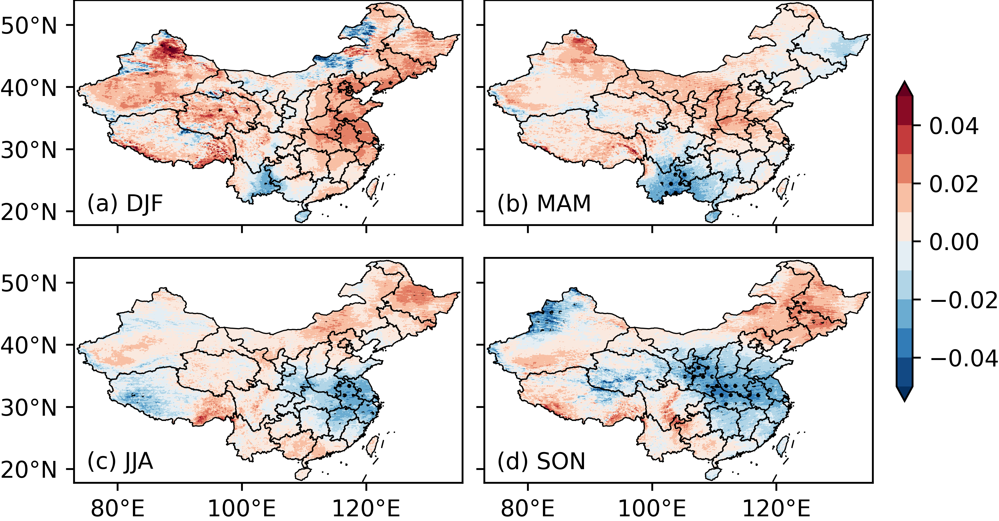

In [28]:
# anomalies in four seasons during strong La Niña
fig = plt.figure(figsize=(6.13, 3.3), dpi=600, layout="constrained")
axs = fig.subplots(2, 2)

levels = np.arange(-0.05, 0.051, 0.01)

ax = axs[0, 0]
x = anom_stronglanina.sel(season="DJF")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_stronglanina.sel(season="DJF"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.text(75, 20, "(a) DJF")
print(np.nanmax(x), np.nanmin(x))

ax = axs[0, 1]
x = anom_stronglanina.sel(season="MAM")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_stronglanina.sel(season="MAM"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.text(75, 20, "(b) MAM")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 0]
x = anom_stronglanina.sel(season="JJA")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_stronglanina.sel(season="JJA"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.text(75, 20, "(c) JJA")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 1]
x = anom_stronglanina.sel(season="SON")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
ax.contourf(
    lon,
    lat,
    anomp_stronglanina.sel(season="SON"),
    levels=[0, 0.1],
    colors="none",
    hatches=["..."],
)
plot_cnboundaries(ax)
ax.set_yticklabels([])
ax.text(75, 20, "(d) SON")
print(np.nanmax(x), np.nanmin(x))

cb = plt.colorbar(cf, ax=axs, shrink=0.9, pad=0.03, fraction=0.02, extend="max")
fig.savefig(
    FIGUREROOT.joinpath("anom_stronglanina.png").with_suffix(figsuffix), dpi=figdpi
)

0.26003063 -0.19424292
0.16518465 -0.09671113
0.1463005 -0.09707472
0.20324579 -0.2117337


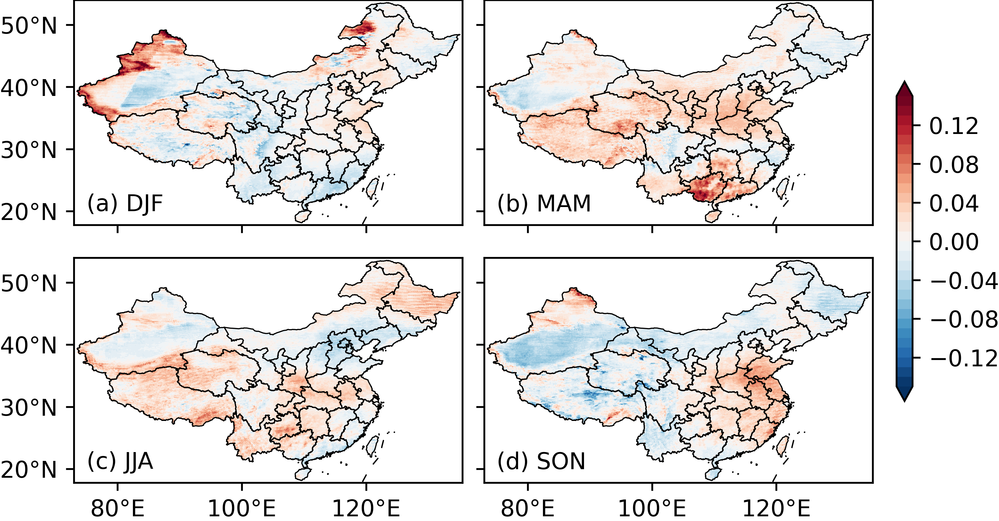

In [29]:
# central-Pacific El Niño 1995
fig = plt.figure(figsize=(6.13, 3.3), dpi=600, layout="constrained")
axs = fig.subplots(2, 2)

levels = np.arange(-0.15, 0.151, 0.01)

ax = axs[0, 0]
x = sea.sel(season="DJF", year=1995) - sea.sel(season="DJF").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.text(75, 20, "(a) DJF")
print(np.nanmax(x), np.nanmin(x))

ax = axs[0, 1]
x = sea.sel(season="MAM", year=1995) - sea.sel(season="MAM").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.text(75, 20, "(b) MAM")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 0]
x = sea.sel(season="JJA", year=1995) - sea.sel(season="JJA").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
plot_cnboundaries(ax)
ax.text(75, 20, "(c) JJA")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 1]
x = sea.sel(season="SON", year=1995) - sea.sel(season="SON").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)

plot_cnboundaries(ax)
ax.set_yticklabels([])
ax.text(75, 20, "(d) SON")
print(np.nanmax(x), np.nanmin(x))

cb = plt.colorbar(cf, ax=axs, shrink=0.9, pad=0.03, fraction=0.02, extend="max")
# fig.savefig(FIGUREROOT.joinpath("anom_elnino-1995.png").with_suffix(figsuffix), dpi=figdpi)

0.1646604 -0.45312375
0.13162673 -0.16022825
0.13982803 -0.13685897
0.15440524 -0.3793699


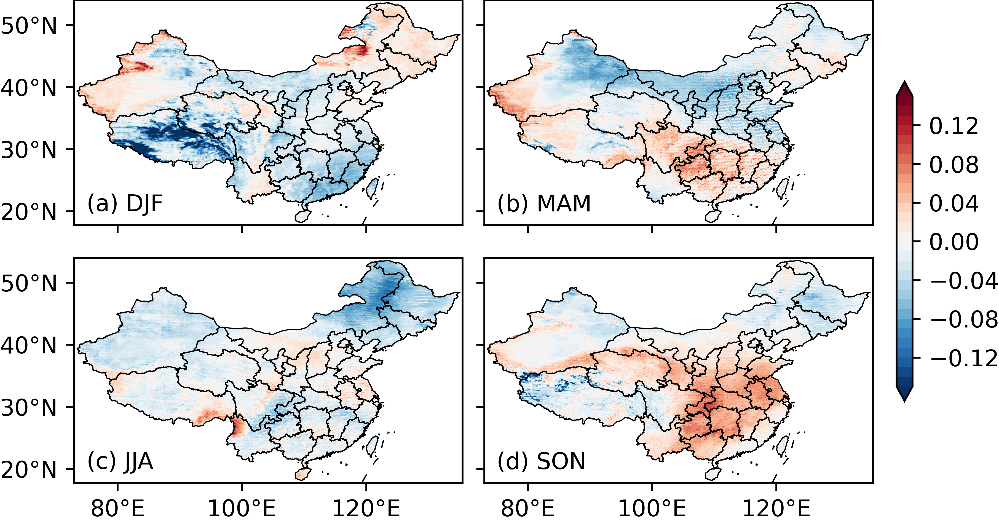

In [30]:
# central-Pacific El Niño 1995
fig = plt.figure(figsize=(6.13, 3.3), dpi=600, layout="constrained")
axs = fig.subplots(2, 2)

levels = np.arange(-0.15, 0.151, 0.01)

ax = axs[0, 0]
x = sea.sel(season="DJF", year=1998) - sea.sel(season="DJF").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.text(75, 20, "(a) DJF")
print(np.nanmax(x), np.nanmin(x))

ax = axs[0, 1]
x = sea.sel(season="MAM", year=1998) - sea.sel(season="MAM").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.text(75, 20, "(b) MAM")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 0]
x = sea.sel(season="JJA", year=1998) - sea.sel(season="JJA").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
plot_cnboundaries(ax)
ax.text(75, 20, "(c) JJA")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 1]
x = sea.sel(season="SON", year=1998) - sea.sel(season="SON").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)

plot_cnboundaries(ax)
ax.set_yticklabels([])
ax.text(75, 20, "(d) SON")
print(np.nanmax(x), np.nanmin(x))

cb = plt.colorbar(cf, ax=axs, shrink=0.9, pad=0.03, fraction=0.02, extend="max")
# fig.savefig(FIGUREROOT.joinpath("anom_elnino-1998.png").with_suffix(figsuffix), dpi=figdpi)

0.24084222 -0.2114371
0.19069862 -0.18984514
0.09544483 -0.12258199
0.18102449 -0.30491075


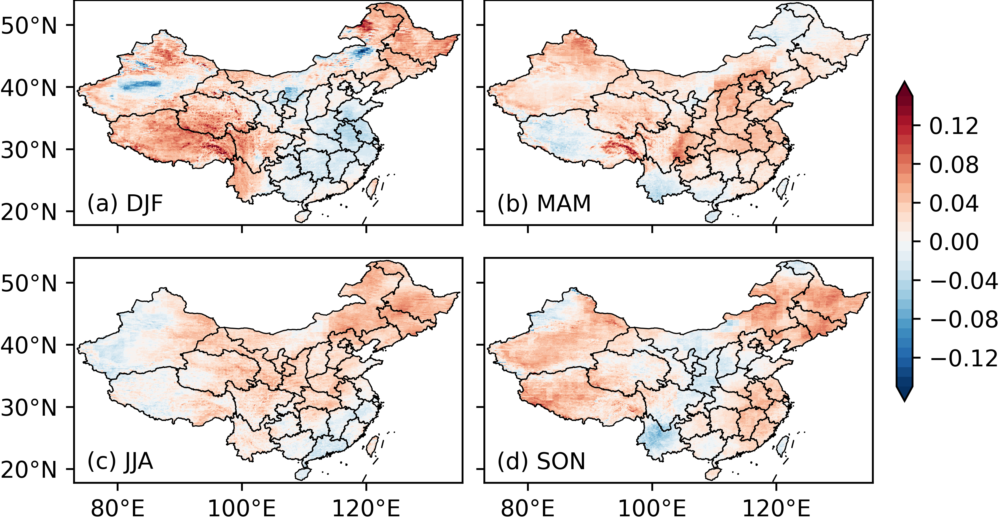

In [31]:
# moderate La Nina 2001
fig = plt.figure(figsize=(6.13, 3.3), dpi=600, layout="constrained")
axs = fig.subplots(2, 2)

levels = np.arange(-0.15, 0.151, 0.01)

ax = axs[0, 0]
x = sea.sel(season="DJF", year=2001) - sea.sel(season="DJF").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.text(75, 20, "(a) DJF")
print(np.nanmax(x), np.nanmin(x))

ax = axs[0, 1]
x = sea.sel(season="MAM", year=2001) - sea.sel(season="MAM").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.text(75, 20, "(b) MAM")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 0]
x = sea.sel(season="JJA", year=2001) - sea.sel(season="JJA").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
plot_cnboundaries(ax)
ax.text(75, 20, "(c) JJA")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 1]
x = sea.sel(season="SON", year=2001) - sea.sel(season="SON").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)

plot_cnboundaries(ax)
ax.set_yticklabels([])
ax.text(75, 20, "(d) SON")
print(np.nanmax(x), np.nanmin(x))

cb = plt.colorbar(cf, ax=axs, shrink=0.9, pad=0.03, fraction=0.02, extend="max")
# fig.savefig(FIGUREROOT.joinpath("anom_lanina-2001.png").with_suffix(figsuffix), dpi=figdpi)

0.18011981 -0.2970713
0.11427736 -0.20638648
0.13907522 -0.125395
0.1260302 -0.32214528


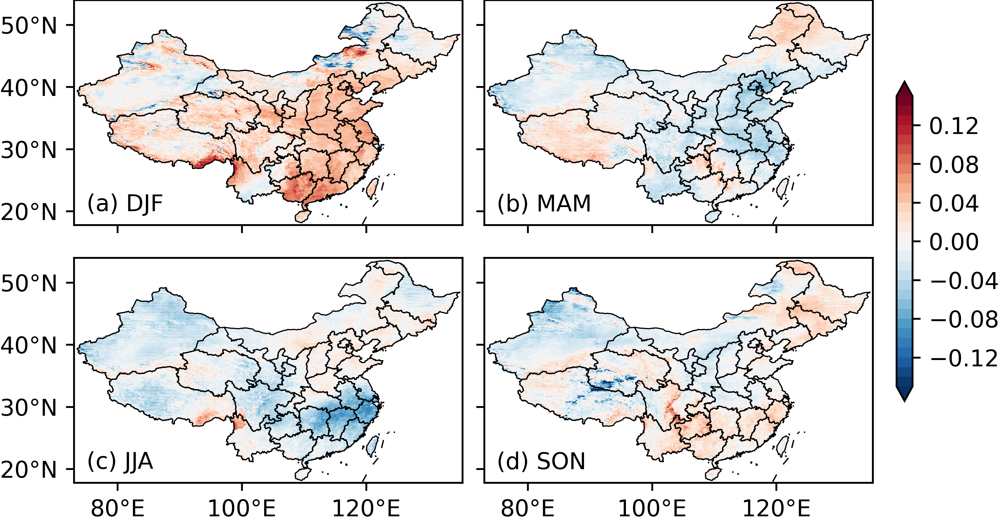

In [32]:
# strong La Nina 1999
fig = plt.figure(figsize=(6.13, 3.3), dpi=600, layout="constrained")
axs = fig.subplots(2, 2)

levels = np.arange(-0.15, 0.151, 0.01)

ax = axs[0, 0]
x = sea.sel(season="DJF", year=1999) - sea.sel(season="DJF").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.text(75, 20, "(a) DJF")
print(np.nanmax(x), np.nanmin(x))

ax = axs[0, 1]
x = sea.sel(season="MAM", year=1999) - sea.sel(season="MAM").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
plot_cnboundaries(ax)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.text(75, 20, "(b) MAM")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 0]
x = sea.sel(season="JJA", year=1999) - sea.sel(season="JJA").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)
plot_cnboundaries(ax)
ax.text(75, 20, "(c) JJA")
print(np.nanmax(x), np.nanmin(x))


ax = axs[1, 1]
x = sea.sel(season="SON", year=1999) - sea.sel(season="SON").mean("year")
cf = ax.contourf(lon, lat, x, cmap="RdBu_r", extend="both", levels=levels)

plot_cnboundaries(ax)
ax.set_yticklabels([])
ax.text(75, 20, "(d) SON")
print(np.nanmax(x), np.nanmin(x))

cb = plt.colorbar(cf, ax=axs, shrink=0.9, pad=0.03, fraction=0.02, extend="max")
# fig.savefig(FIGUREROOT.joinpath("anom_lanina-1999.png").with_suffix(figsuffix), dpi=figdpi)